In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import statsmodels.api as sm
import patsy
import scipy.stats as stats
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

pd.set_option('display.max_columns', 75)
pd.set_option('display.max_rows', 100)

In [ ]:
df = pd.read_csv("/content/newdf.csv")

Looking who is the most expensive player

In [ ]:
df.sort_values(by='Value').tail(20)

,name,Age,Overall rating,Potential,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,team,contract
527,Rodri,26,87,89,231866,191,82,Right,87,CDM,2,88500000,200000,170400000,352,63,64,80,86,59,372,78,65,61,83,85,328,54,62,65,82,65,415,89,72,88,84,82,369,82,83,75,83,46,85,248,84,86,78,49,10,10,7,14,8,2133,454,3,58,72,78,79,83,Manchester City,2019 ~ 2027
196,H. Son,29,88,88,200104,183,78,Right,88,LW,0,89500000,230000,170100000,402,83,91,68,81,79,403,86,87,74,74,82,422,85,88,82,91,76,389,88,60,88,64,89,346,62,39,91,81,73,89,114,47,34,33,53,11,13,13,6,10,2129,451,4,87,89,80,84,42,Tottenham Hotspur,2015 ~ 2025
238,T. Courtois,30,90,91,192119,199,96,Left,90,GK,1,90000000,250000,191300000,86,14,14,13,33,12,110,13,19,20,35,23,286,42,52,63,84,45,249,56,68,38,70,17,122,23,15,13,44,27,66,54,20,18,16,427,84,89,75,89,90,1334,473,4,84,89,75,90,46,Real Madrid,2018 ~ 2026
115,J. Musiala,19,84,92,256790,184,72,Right,85,CAM,8,91000000,51000,168400000,337,66,76,49,81,65,371,92,67,49,75,88,430,84,79,92,84,91,330,71,55,77,53,74,336,59,65,78,81,53,85,196,64,63,69,42,6,9,8,8,11,2042,442,2,81,73,75,90,63,FC Bayern München,2020 ~ 2026
738,Marquinhos,28,88,90,207865,183,75,Right,89,CB,2,92000000,170000,177100000,334,68,59,88,84,35,323,69,58,32,85,79,379,77,81,68,87,66,362,65,92,82,78,45,368,81,89,70,76,52,86,268,90,89,89,47,6,6,12,10,13,2081,453,3,79,56,75,74,89,Paris Saint Germain,2013 ~ 2024
135,C. Nkunku,24,86,89,232411,175,73,Right,88,CAM,3,94000000,90000,166900000,383,81,86,61,85,70,419,89,82,80,80,88,429,81,85,88,85,90,358,79,59,78,64,78,360,59,64,86,84,67,81,180,62,64,54,43,5,6,10,15,7,2172,463,3,83,81,83,88,62,RB Leipzig,2019 ~ 2024
151,Bernardo Silva,27,88,88,218667,173,64,Left,88,CM,0,96500000,260000,178500000,382,84,78,51,91,78,414,92,84,67,80,91,417,78,64,95,88,92,355,79,51,93,54,78,384,78,69,83,86,68,89,204,70,74,60,54,9,10,14,12,9,2210,461,2,70,78,85,92,68,Manchester City,2017 ~ 2025
742,M. Salah,30,89,89,209331,175,71,Left,89,RW,0,99500000,260000,184100000,398,80,92,59,84,83,404,88,84,69,77,86,450,89,89,89,92,91,398,82,69,87,76,84,374,63,55,91,84,81,90,122,38,43,41,62,14,14,9,11,14,2208,466,4,89,87,81,88,45,Liverpool,2017 ~ 2025
127,Neymar Jr,30,89,89,190871,175,68,Right,89,LW,0,99500000,200000,184100000,400,83,83,63,85,86,445,95,88,87,81,94,437,88,86,93,88,82,353,79,62,79,52,81,367,63,37,86,90,91,93,96,35,32,29,59,9,9,15,15,11,2157,446,5,87,83,85,93,37,Paris Saint Germain,2017 ~ 2025
51,F. Valverde,23,86,91,239053,182,78,Right,87,CM,5,102000000,210000,216800000,369,78,76,59,86,70,396,81,74,69,87,85,407,84,91,77,87,68,407,89,62,89,80,87,385,81,81,80,84,59,84,240,79,82,79,45,6,10,6,15,8,2249,493,1,88,80,83,82,78,Real Madrid,2016 ~ 2027


In [ ]:
df.loc[527].values #most expensive player stats

array(['Rodri ', 26, 87, 89, 231866, 191, 82, 'Right', 87, 'CDM', 2,
       88500000, 200000, 170400000, 352, 63, 64, 80, 86, 59, 372, 78, 65,
       61, 83, 85, 328, 54, 62, 65, 82, 65, 415, 89, 72, 88, 84, 82, 369,
       82, 83, 75, 83, 46, 85, 248, 84, 86, 78, 49, 10, 10, 7, 14, 8,
       2133, 454, 3, 58, 72, 78, 79, 83, 'Manchester City', '2019 ~ 2027'],
      dtype=object)

code filters the DataFrame df to include only the rows where the value in the 'Value' column is not equal to 1000, and assigns the filtered DataFrame back to the variable df.

In [ ]:
df = df[df['Value']!=1000]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2702 entries, 0 to 2701
Data columns (total 65 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   name                      2702 non-null   object
 1   Age                       2702 non-null   int64 
 2   Overall rating            2702 non-null   int64 
 3   Potential                 2702 non-null   int64 
 4   ID                        2702 non-null   int64 
 5   Height                    2702 non-null   int64 
 6   Weight                    2702 non-null   int64 
 7   foot                      2702 non-null   object
 8   Best overall              2702 non-null   int64 
 9   Best position             2702 non-null   object
 10  Growth                    2702 non-null   int64 
 11  Value                     2702 non-null   int64 
 12  Wage                      2702 non-null   int64 
 13  Release clause            2702 non-null   int64 
 14  Total attacking         

In [ ]:
df = pd.get_dummies(df,columns=['foot'],drop_first=True)

In [ ]:
df.drop(['ID','Growth','Wage', 'Release clause','Crossing','Short passing','Volleys','Dribbling','Curve','FK Accuracy','Long passing','Acceleration','Sprint speed','Agility','Reactions','Balance','Jumping','Stamina','Long shots','Aggression','Interceptions','Penalties','Composure','Total defending','Marking','Standing tackle','Sliding tackle','Total goalkeeping','Base stats','contract',
         'Best overall','Total attacking','Heading accuracy','Positioning','Vision','Strength','Total skill','Best position','team','Total stats'







        ],axis=1,inplace=True)

In [ ]:
df.sort_values(by='Value')

,name,Age,Overall rating,Potential,Height,Weight,Value,Finishing,Ball control,Total movement,Total power,Shot power,Total mentality,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,foot_Right
658,A. Vega,24,79,82,173,77,0,76,78,401,386,80,317,5,11,12,8,7,1,80,77,76,83,32,1
753,J. Gallardo,27,75,75,176,73,0,69,74,384,370,75,336,9,7,8,12,11,1,83,67,70,75,69,0
1533,J. Gaber,20,62,76,182,71,0,25,51,291,295,41,246,12,10,6,9,10,1,63,31,47,49,60,0
1532,E. Addo,22,65,72,180,73,0,62,72,330,332,69,305,5,9,11,11,6,1,69,63,60,68,57,1
1487,N. Araújo,30,75,75,188,87,0,35,69,293,318,57,265,7,8,13,6,9,1,64,41,57,58,75,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,K. De Bruyne,31,91,91,181,75,107500000,85,90,393,409,92,405,15,13,5,10,13,4,74,88,93,86,63,1
12,Vinícius Jr.,21,86,92,176,73,109000000,84,89,449,375,76,306,5,7,7,7,10,2,95,79,74,90,29,1
152,F. de Jong,25,87,92,180,74,116500000,72,89,417,373,68,374,7,13,10,10,9,3,82,69,86,87,77,1
30,E. Haaland,21,90,94,195,94,176500000,95,82,419,430,94,382,7,14,13,11,7,4,89,92,65,80,48,0


In [ ]:
#looking correlations
corr_matrix = df.corr()
corr_matrix

<ipython-input-10-56eec603d089>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


,Age,Overall rating,Potential,Height,Weight,Value,Finishing,Ball control,Total movement,Total power,Shot power,Total mentality,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,foot_Right
Age,1.000000,0.532813,-0.173025,0.059494,0.240049,0.185960,0.146393,0.147253,-0.030064,0.316779,0.343553,0.277764,0.122182,0.128304,0.132378,0.131527,0.126887,0.597092,-0.144400,0.340352,0.443140,0.308293,0.181571,0.049838
Overall rating,0.532813,1.000000,0.630721,0.053050,0.146063,0.716968,0.301342,0.431849,0.314262,0.538658,0.520446,0.492342,0.058700,0.058373,0.060620,0.065854,0.066651,0.573681,0.215424,0.481531,0.735255,0.697903,0.333054,0.001389
Potential,-0.173025,0.630721,1.000000,0.042213,-0.006255,0.610678,0.167232,0.301108,0.274826,0.244513,0.255014,0.260681,0.012827,0.013622,0.017884,0.019495,0.020968,0.287518,0.259873,0.244336,0.438278,0.487072,0.194637,-0.026454
Height,0.059494,0.053050,0.042213,1.000000,0.754072,0.044770,-0.371078,-0.374865,-0.608337,-0.075110,-0.158953,-0.280353,0.320073,0.318385,0.312127,0.321237,0.321304,0.053176,-0.304990,-0.138674,-0.197231,-0.300962,0.131922,0.033460
Weight,0.240049,0.146063,-0.006255,0.754072,1.000000,0.074722,-0.260068,-0.279775,-0.489886,0.054152,-0.019573,-0.179654,0.270176,0.272002,0.268342,0.274313,0.272310,0.175816,-0.264857,-0.037504,-0.118886,-0.208754,0.106157,0.048988
Value,0.185960,0.716968,0.610678,0.044770,0.074722,1.000000,0.247095,0.328716,0.277710,0.377418,0.364292,0.352043,0.018224,0.021376,0.023643,0.026479,0.026052,0.538981,0.218269,0.355142,0.524353,0.514825,0.211500,-0.010377
Finishing,0.146393,0.301342,0.167232,-0.371078,-0.260068,0.247095,1.000000,0.779381,0.667619,0.699982,0.748499,0.678847,-0.564900,-0.565278,-0.552278,-0.559326,-0.560545,0.211547,0.260431,0.652634,0.372289,0.501612,-0.273324,0.020716
Ball control,0.147253,0.431849,0.301108,-0.374865,-0.279775,0.328716,0.779381,1.000000,0.742160,0.746524,0.601898,0.886571,-0.783401,-0.781984,-0.768790,-0.776822,-0.778193,0.249758,0.157473,0.244836,0.389167,0.427163,0.189026,-0.062440
Total movement,-0.030064,0.314262,0.274826,-0.608337,-0.489886,0.277710,0.667619,0.742160,1.000000,0.554345,0.450886,0.617545,-0.566845,-0.572357,-0.571665,-0.571224,-0.567468,0.077935,0.669742,0.272247,0.314149,0.508084,-0.021703,-0.062337
Total power,0.316779,0.538658,0.244513,-0.075110,0.054152,0.377418,0.699982,0.746524,0.554345,1.000000,0.769431,0.809758,-0.542040,-0.543535,-0.544029,-0.538350,-0.539532,0.284344,0.143368,0.418920,0.381714,0.371706,0.222111,0.017023


Text(0.5, 1.0, 'Correlation Heatmap')

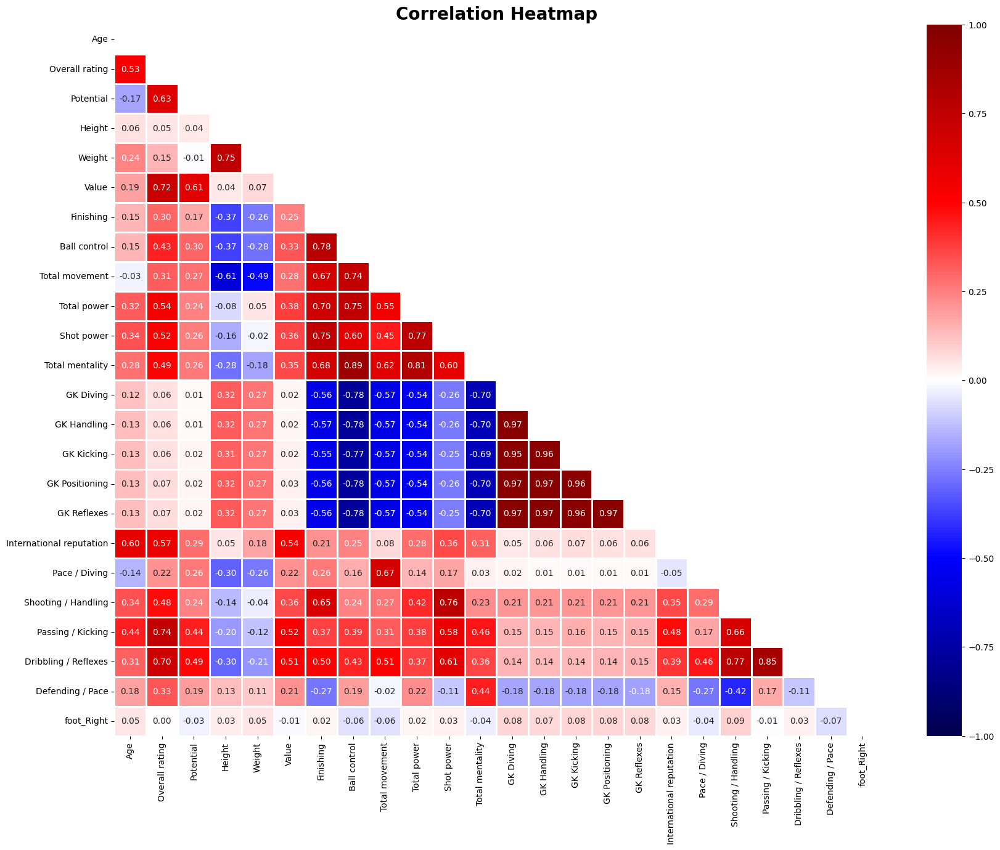

In [ ]:
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
#plt.savefig('heatmap1.png',transparent=True, bbox_inches='tight')

In [ ]:
df = df.drop(['Height','Weight','foot_Right'],axis=1)

#['Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing']

<ipython-input-13-243124c4da5e>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


Text(0.5, 1.0, 'Correlation Heatmap')

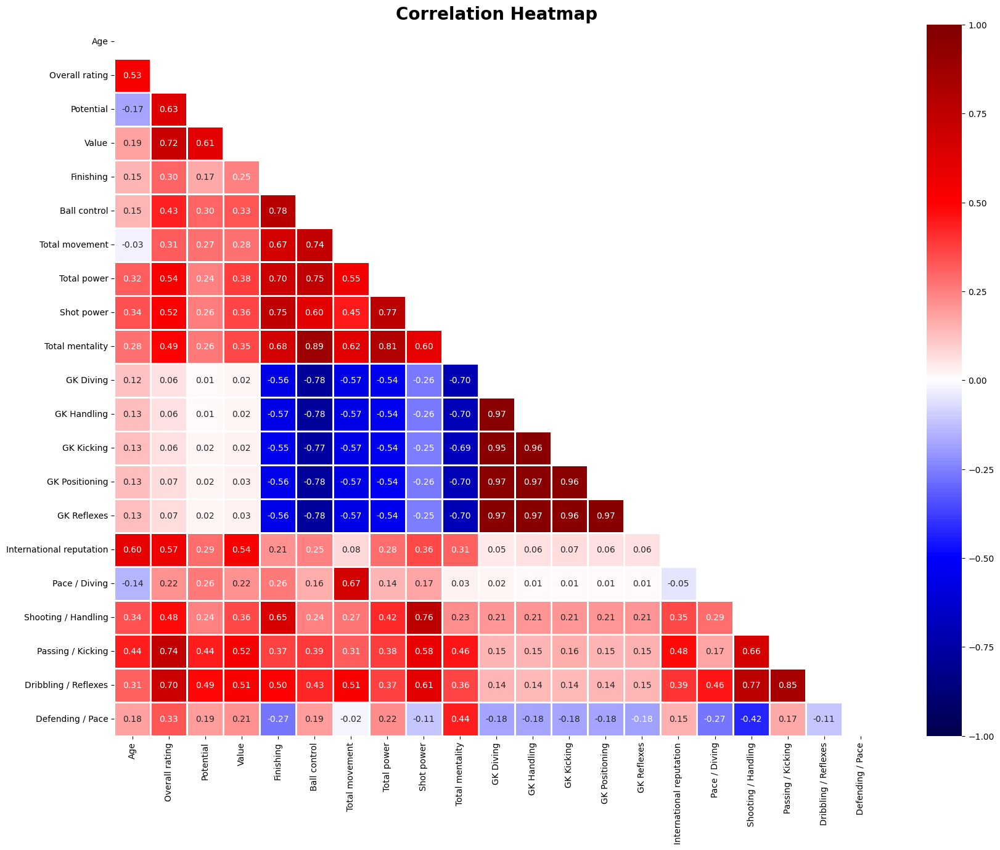

In [ ]:
corr_matrix = df.corr()
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
#plt.savefig('heatmap2.png',transparent=True, bbox_inches='tight')

Obtains a scatter plot with box plots of selected features.

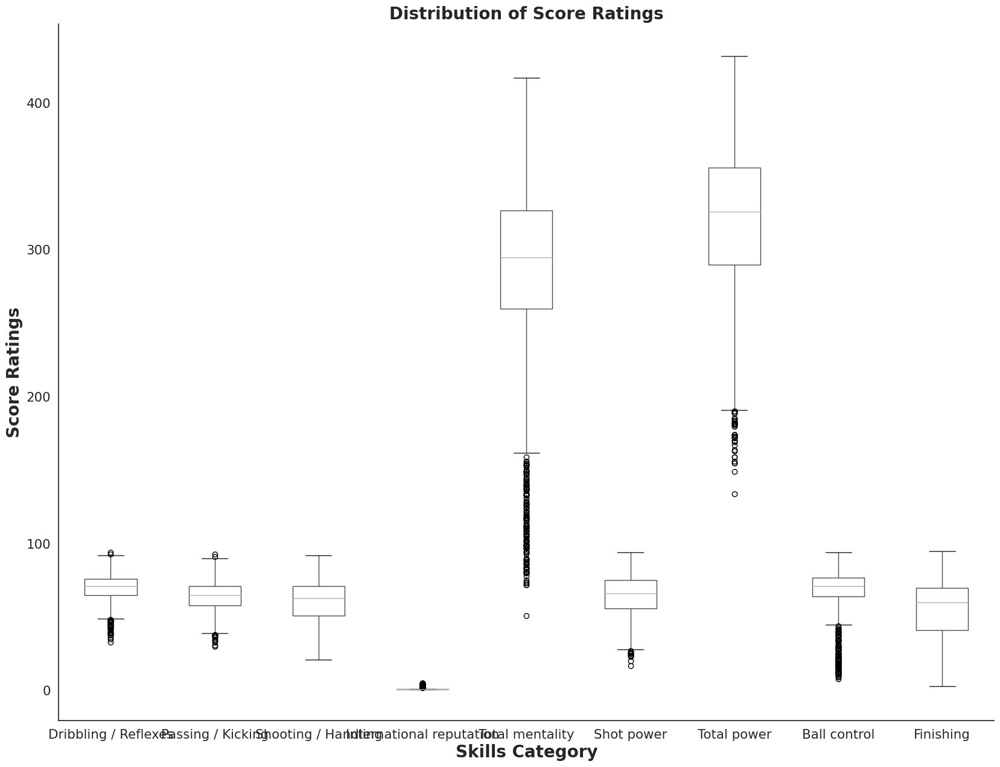

In [ ]:
fig = plt.figure(figsize=[20,15])
sns.set(style='white', font_scale=1.4)
df[['Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']].boxplot()
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()
# plt.savefig('boxplot.png', transparent=True, bbox_inches='tight')


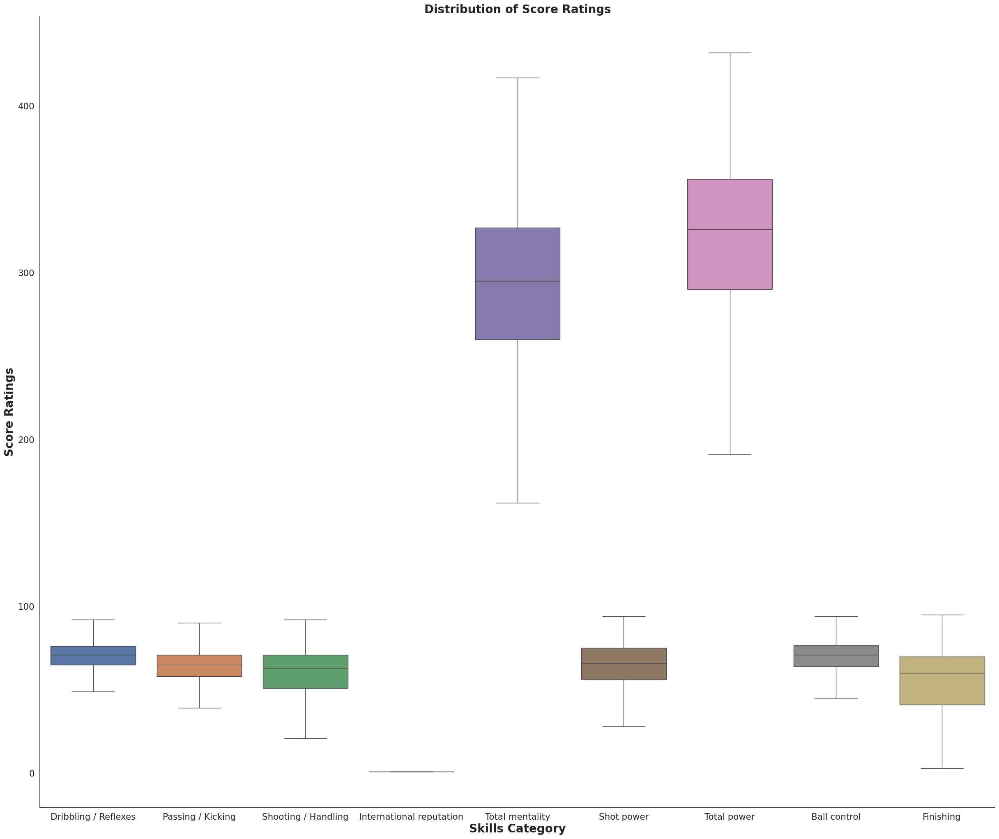

In [ ]:
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = df[['Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']]
sns.boxplot(data=data, showfliers=False)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()
# plt.savefig('boxplot.png', transparent=True, bbox_inches='tight')


<ipython-input-16-25f82908c1e4>:4: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q1 = df.quantile(0.25)
<ipython-input-16-25f82908c1e4>:5: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  Q3 = df.quantile(0.75)
<ipython-input-16-25f82908c1e4>:13: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  filtered_df = df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]


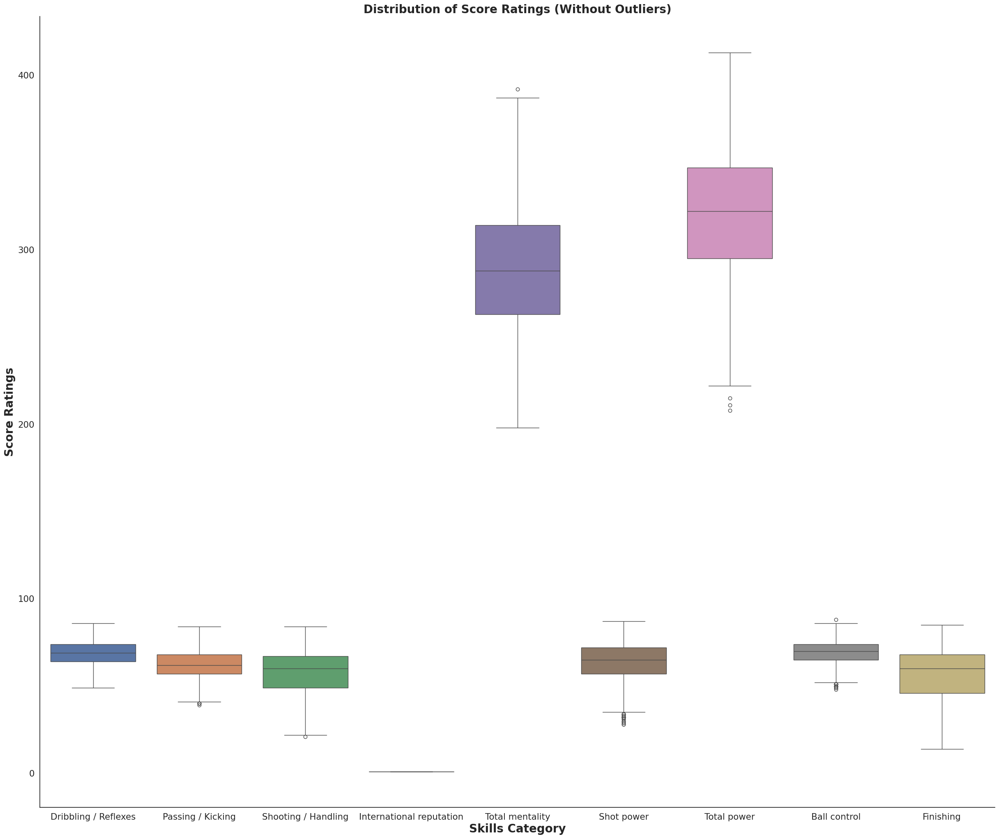

In [ ]:
import numpy as np

# Calculate the IQR for each column
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Define the upper and lower bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers from the dataset
filtered_df = df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]

# Create the boxplot with the filtered dataset
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = filtered_df[['Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing']]
sns.boxplot(data=data)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings (Without Outliers)', fontsize=20, weight='bold')
sns.despine()


This code runs to generate a pairwise scatter plot showing the relationship between the variables in the data set

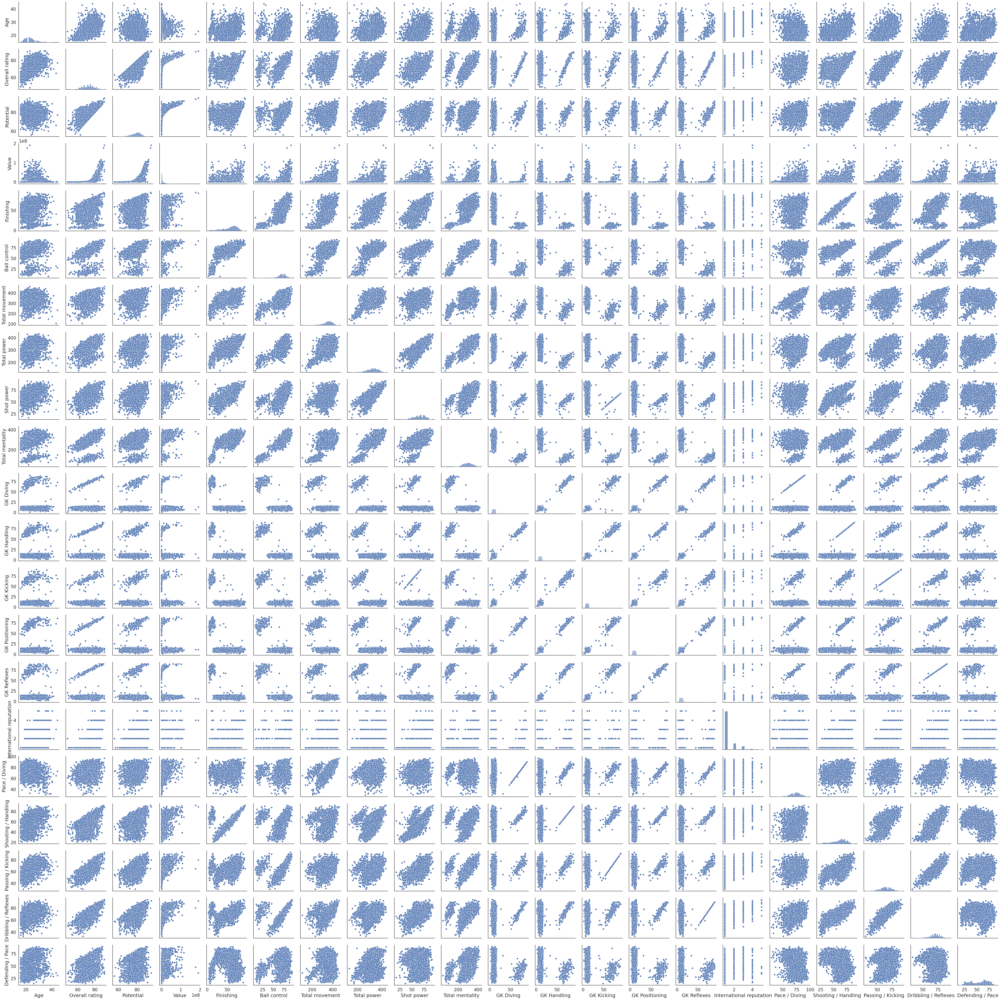

In [ ]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(df)
#plt.savefig('pairplot1.png',transparent=True, bbox_inches='tight')

Selecting the features that affect the correlation the most and assigning them to the new dataset

In [ ]:
selected_columns = ['name','Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing','Value']
new_df = df[selected_columns].copy()



In [ ]:
new_df

,name,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing,Value
0,J. Todibo,22,67,63,47,1,305,60,335,72,44,24500000
1,B. Verbruggen,19,76,71,70,1,99,53,218,18,8,5500000
2,M. Ugarte,21,77,71,63,1,355,62,336,77,65,26000000
3,Z. Debast,18,67,67,53,1,295,60,327,71,51,3500000
4,07 D. Last,37,60,63,55,3,74,30,134,8,32,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2697,D. Mihailovic,23,76,76,70,1,331,75,349,77,71,11500000
2698,G. Togni,24,71,65,66,1,329,73,336,70,65,2000000
2699,M. Camara,25,74,73,74,1,366,84,391,76,71,7000000
2700,S. Kaba,27,67,59,67,1,299,76,369,73,68,1500000


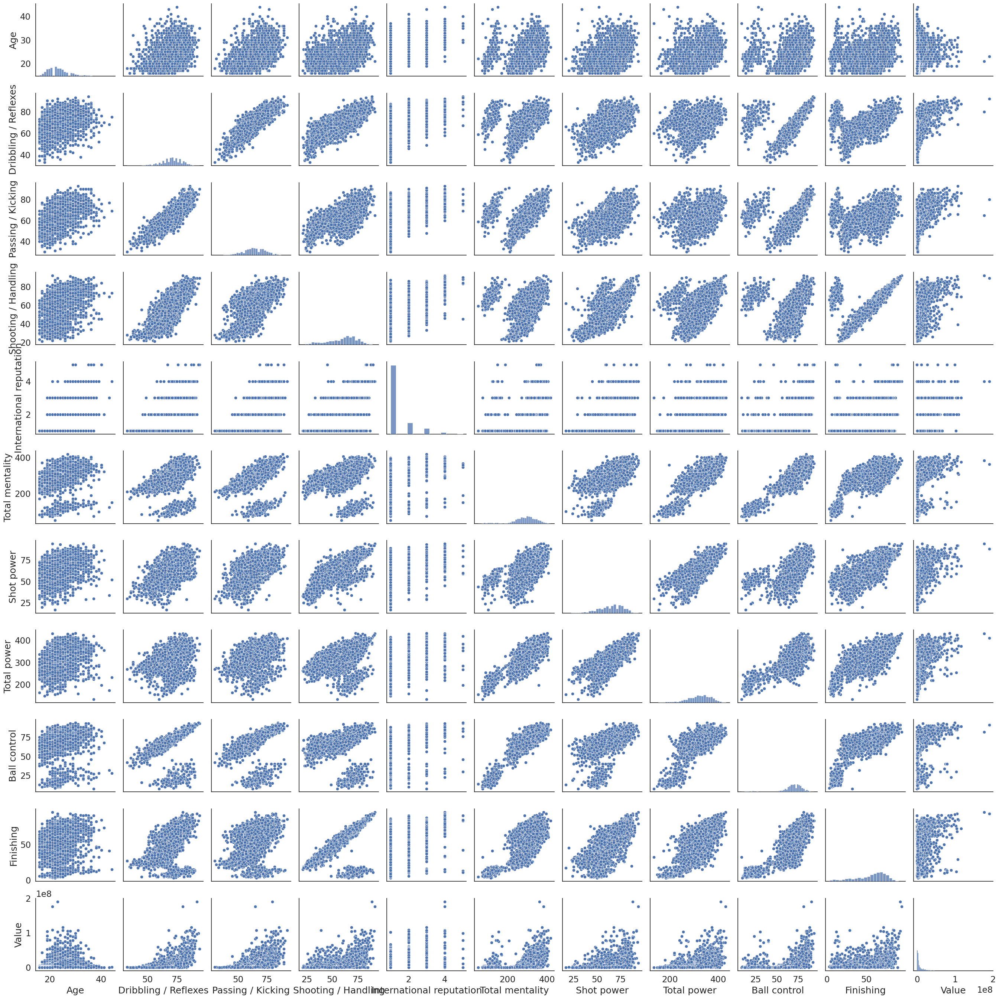

In [ ]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(new_df)

In [ ]:


y, X = patsy.dmatrices("Q('Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=new_df, return_type="dataframe")
model = sm.OLS(y, X)
fit = model.fit()
fit.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Q('Value')   R-squared:                       0.523
Model:                            OLS   Adj. R-squared:                  0.521
Method:                 Least Squares   F-statistic:                     295.3
Date:                Wed, 27 Mar 2024   Prob (F-statistic):               0.00
Time:                        09:38:35   Log-Likelihood:                -47675.
No. Observations:                2702   AIC:                         9.537e+04
Df Residuals:                    2691   BIC:                         9.544e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -5.648e+07   2.43e+06    -23.196      0.000   -6.13e+07   -5.17e+07
Q('Age')                      -1.309e+06   6.61e+04    -19.812      0.000   -1.44e+06   -1.18e+06
Q('Dribbling / Reflexes')      4.268e+05   6.91e+04      6.176      0.000    2.91e+05    5.62e+05
Q('Passing / Kicking')         1.888e+05   5.86e+04      3.219      0.001    7.38e+04    3.04e+05
Q('Shooting / Handling')       3.084e+05   7.99e+04      3.858      0.000    1.52e+05    4.65e+05
Q('International reputation')  1.167e+07   4.01e+05     29.118      0.000    1.09e+07    1.25e+07
Q('Total mentality')           2865.7922   1.08e+04      0.266      0.790   -1.83e+04     2.4e+04
Q('Shot power')                -3.44e+05   4.59e+04     -7.489      0.000   -4.34e+05   -2.54e+05
Q('Total power')               1.511e+05   1.03e+04     14.651      0.000    1.31e+05    1.71e+05
Q('Ball control')              1.823e+05   6.37e+04      2.862      0.004    5.74e+04    3.07e+05
Q('Finishing')                -3.278e+05   4.87e+04     -6.732      0.000   -4.23e+05   -2.32e+05
==============================================================================
Omnibus:                     1750.051   Durbin-Watson:                   1.602
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            42395.420
Skew:                           2.672   Prob(JB):                         0.00
Kurtosis:                      21.655   Cond. No.                     5.28e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.28e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
df1 = new_df.copy()

In [ ]:
mask = new_df['Value'] > 0  # Create a boolean mask for non-zero values
df1['Value'] = np.log(new_df.loc[mask, 'Value'])  # Apply log only to non-zero values


In [ ]:
df1 = df1.rename(columns={'Value':'Log Market Value'})

<ipython-input-25-0ddef4ff367e>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df1.corr()


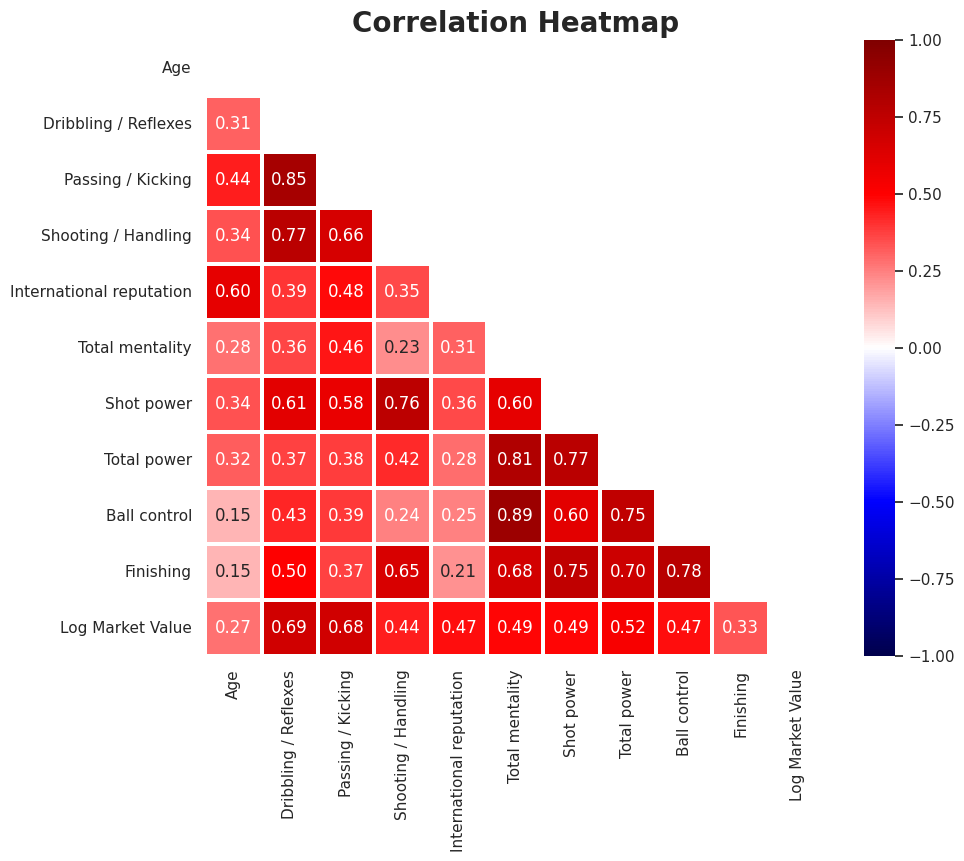

In [ ]:
sns.set(font_scale=1,style='white')
corr_matrix = df1.corr()
fig = plt.figure(figsize=[10,8])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1.5,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
plt.savefig('heatmap3.png',transparent=True, bbox_inches='tight')

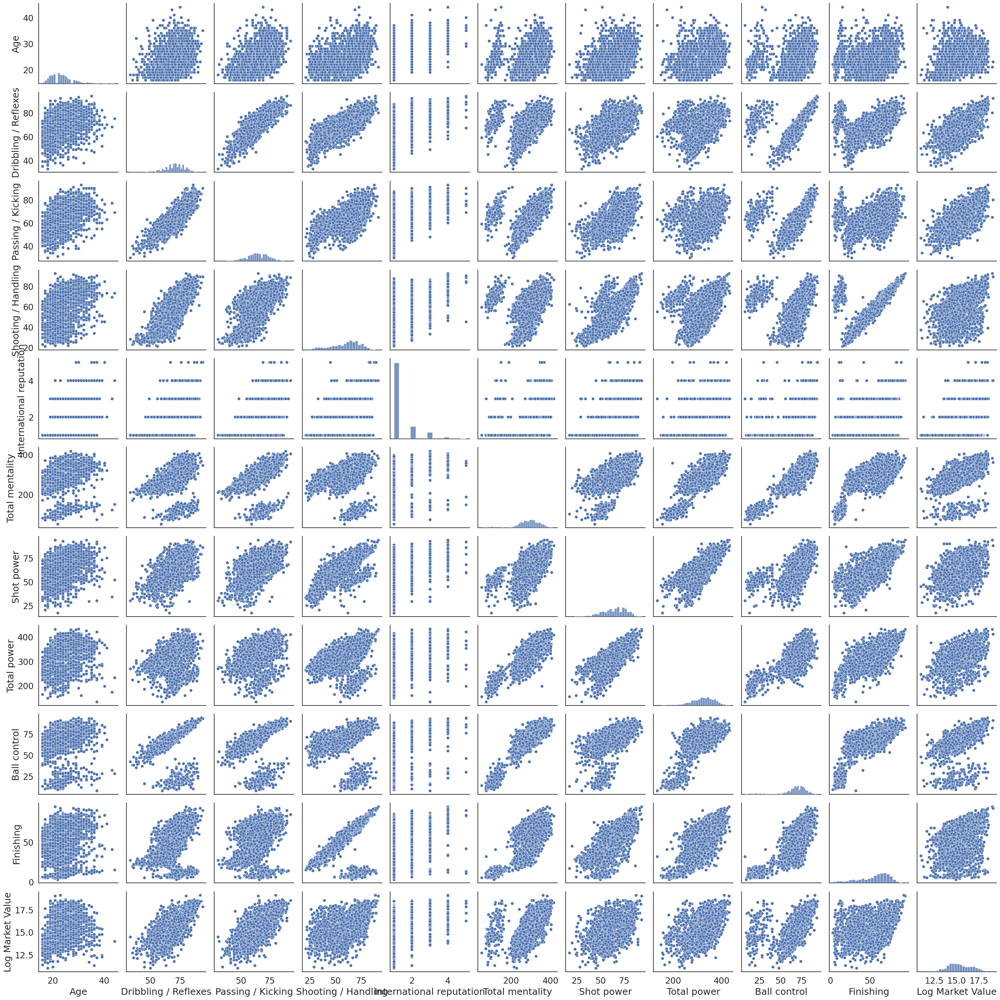

In [ ]:
sns.set(style='white', font_scale=1.5)
sns.pairplot(df1)
plt.savefig('pairplot2.png', transparent=True, bbox_inches='tight')


Taking the logarithm of the market values created a normal distribution and increased the R-sq value

In [ ]:
y, X = patsy.dmatrices("Q('Log Market Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=df1, return_type="dataframe")

model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Q('Log Market Value')   R-squared:                       0.696
Model:                               OLS   Adj. R-squared:                  0.695
Method:                    Least Squares   F-statistic:                     606.0
Date:                   Wed, 27 Mar 2024   Prob (F-statistic):               0.00
Time:                           09:40:21   Log-Likelihood:                -2975.5
No. Observations:                   2656   AIC:                             5973.
Df Residuals:                       2645   BIC:                             6038.
Df Model:                             10                                         
Covariance Type:               nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         5.7663      0.165     34.956      0.000       5.443       6.090
Q('Age')                         -0.0681      0.005    -15.122      0.000      -0.077      -0.059
Q('Dribbling / Reflexes')         0.0623      0.005     13.370      0.000       0.053       0.071
Q('Passing / Kicking')            0.0184      0.004      4.640      0.000       0.011       0.026
Q('Shooting / Handling')          0.0312      0.005      5.749      0.000       0.021       0.042
Q('International reputation')     0.4184      0.027     15.412      0.000       0.365       0.472
Q('Total mentality')              0.0003      0.001      0.383      0.702      -0.001       0.002
Q('Shot power')                  -0.0286      0.003     -9.274      0.000      -0.035      -0.023
Q('Total power')                  0.0156      0.001     22.206      0.000       0.014       0.017
Q('Ball control')                 0.0347      0.004      7.987      0.000       0.026       0.043
Q('Finishing')                   -0.0444      0.003    -13.316      0.000      -0.051      -0.038
==============================================================================
Omnibus:                       38.187   Durbin-Watson:                   1.663
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.631
Skew:                           0.268   Prob(JB):                     1.50e-09
Kurtosis:                       3.281   Cond. No.                     5.32e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.32e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
def diagnostic_plot(x, y):
    plt.figure(figsize=(20,5))

    rgr = LinearRegression()
    rgr.fit(x,y)
    pred = rgr.predict(x)

    plt.subplot(1, 3, 1)
    plt.scatter(pred,y,alpha=0.1)
    plt.plot(y, y, color='red',linewidth=1,)
    plt.title("Regression fit")
    plt.xlabel("Predicted y")
    plt.ylabel("y")

    plt.subplot(1, 3, 2)
    res = y - pred
    plt.scatter(pred, res,alpha=0.1)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")

    print(res)

    plt.subplot(1, 3, 3)
    #Generates a probability plot of sample data against the quantiles of a
    # specified theoretical distribution
    stats.probplot(res, dist="norm", plot=plt,)
    plt.title("Normal Q-Q plot")

In [ ]:
y = df1['Log Market Value']
X = df1.drop(['name','Log Market Value'],axis=1)

In [ ]:
y

0       17.014184
1       15.520259
2       17.073607
3       15.068274
4             NaN
          ...    
2697    16.257858
2698    14.508658
2699    15.761421
2700    14.220976
2701    13.345507
Name: Log Market Value, Length: 2702, dtype: float64

0       1.396447
1       0.224155
2       0.903183
3      -0.610642
5      -0.563806
          ...   
2697    0.417963
2698   -0.501570
2699   -0.258426
2700   -0.646415
2701   -1.298432
Name: Log Market Value, Length: 2656, dtype: float64


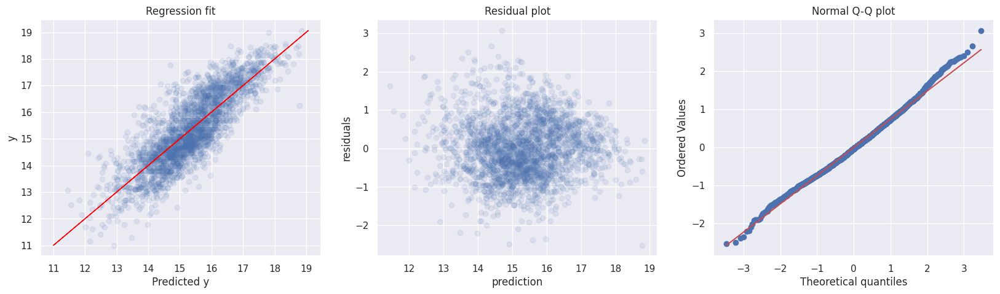

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer

# Remove rows with missing values from X and y
combined_df = pd.concat([X, y], axis=1)
combined_df.dropna(inplace=True)

# Separate X and y after removing missing values
X = combined_df.iloc[:, :-1]
y = combined_df.iloc[:, -1]

# Use the diagnostic_plot() function with the updated X and y
sns.set(style='darkgrid')
diagnostic_plot(X, y)


In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [ ]:
selected_columns2 = ['Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Shot power', 'Total power', 'Ball control', 'Finishing']


In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
df1

,name,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing,Log Market Value
0,J. Todibo,22,67,63,47,1,305,60,335,72,44,17.014184
1,B. Verbruggen,19,76,71,70,1,99,53,218,18,8,15.520259
2,M. Ugarte,21,77,71,63,1,355,62,336,77,65,17.073607
3,Z. Debast,18,67,67,53,1,295,60,327,71,51,15.068274
4,07 D. Last,37,60,63,55,3,74,30,134,8,32,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2697,D. Mihailovic,23,76,76,70,1,331,75,349,77,71,16.257858
2698,G. Togni,24,71,65,66,1,329,73,336,70,65,14.508658
2699,M. Camara,25,74,73,74,1,366,84,391,76,71,15.761421
2700,S. Kaba,27,67,59,67,1,299,76,369,73,68,14.220976


In [ ]:
df1.isna().sum()

name                         0
Age                          0
Dribbling / Reflexes         0
Passing / Kicking            0
Shooting / Handling          0
International reputation     0
Total mentality              0
Shot power                   0
Total power                  0
Ball control                 0
Finishing                    0
Log Market Value            46
dtype: int64

In [ ]:
df1 = df1.dropna()

In [ ]:
df1.isna().sum()

name                        0
Age                         0
Dribbling / Reflexes        0
Passing / Kicking           0
Shooting / Handling         0
International reputation    0
Total mentality             0
Shot power                  0
Total power                 0
Ball control                0
Finishing                   0
Log Market Value            0
dtype: int64

In [ ]:
X_train = df1.drop(['name', 'Log Market Value'], axis=1)
y_train = df1['Log Market Value']
reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [ ]:
model = reg.fit(X,y)

In [ ]:
model.intercept_

5.766291291609296

In [ ]:
model.coef_

array([-6.81489648e-02,  6.23469638e-02,  1.84345146e-02,  3.12264893e-02,
        4.18442200e-01,  2.79180750e-04, -2.86286267e-02,  1.55685585e-02,
        3.46522361e-02, -4.43601416e-02])

In [ ]:
reg.score(X_train, y_train)

0.696160575702947

In [ ]:
from sklearn.ensemble import RandomForestRegressor


In [ ]:
forest = RandomForestRegressor()

forest.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
forest.score(X_train, y_train)

0.9763966376204554

In [ ]:
from sklearn.linear_model import Lasso

lasso_reg = Lasso(alpha=1.0)
lasso_reg.fit(X_train, y_train)

print("Lasso Regressor R^2 Score:", lasso_reg.score(X_test, y_test))

Lasso Regressor R^2 Score: 0.6304553031219577


In [ ]:
from sklearn.linear_model import Ridge

ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_train, y_train)

print("Ridge Regressor R^2 Score:", ridge_reg.score(X_test, y_test))


Ridge Regressor R^2 Score: 0.7060439659541675


In [ ]:
from sklearn.ensemble import AdaBoostRegressor

ada_boost_reg = AdaBoostRegressor(n_estimators=50, learning_rate=1.0, random_state=42)
ada_boost_reg.fit(X_train, y_train)

print("AdaBoost Regressor R^2 Score:", ada_boost_reg.score(X_test, y_test))


AdaBoost Regressor R^2 Score: 0.7610628331524093


In [ ]:
import lightgbm as lgb

lgb_reg_opt = lgb.LGBMRegressor(
    num_leaves=50,
    learning_rate=0.05,
    n_estimators=200
)
lgb_reg_opt.fit(X_train, y_train)

print("Optimized LightGBM Regressor R^2 Score:", lgb_reg_opt.score(X_test, y_test))


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 888
[LightGBM] [Info] Number of data points in the train set: 2656, number of used features: 10
[LightGBM] [Info] Start training from score 15.315700
Optimized LightGBM Regressor R^2 Score: 0.9712739508173465


making dataframe


In [ ]:
X_test.head()

,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing
841,27,74,67,53,1,333,60,357,75,50
125,20,74,73,68,1,108,55,205,20,5
1605,22,67,66,48,1,295,57,298,70,44
1636,19,54,49,31,1,241,41,266,57,28
709,23,70,74,67,1,359,84,388,75,58


In [ ]:
# Assuming you have trained your model and obtained predictions on the testing dataset
predictions_forest = forest.predict(X_test)
predictions_reg = reg.predict(X_test)
predictions_lgbm = lgb_reg_opt.predict(X_test)
predictions_ada = ada_boost_reg.predict(X_test)
predictions_ridge = ridge_reg.predict(X_test)
predictions_lasso = lasso_reg.predict(X_test)

# Create a new DataFrame for predictions and actual values
results_df = pd.DataFrame({'Predicted Market Value (Random Forest)': predictions_forest,
                           'Predicted Market Value (Linear Regression)': predictions_reg,
                           'Predicted Using LGBM': predictions_lgbm,
                           'Predicted Using Adaboost': predictions_ada,
                           'Predicted Using Ridge': predictions_ridge,
                           'Predicted Using lasso': predictions_lasso,
                           'Actual Market Value': y_test})



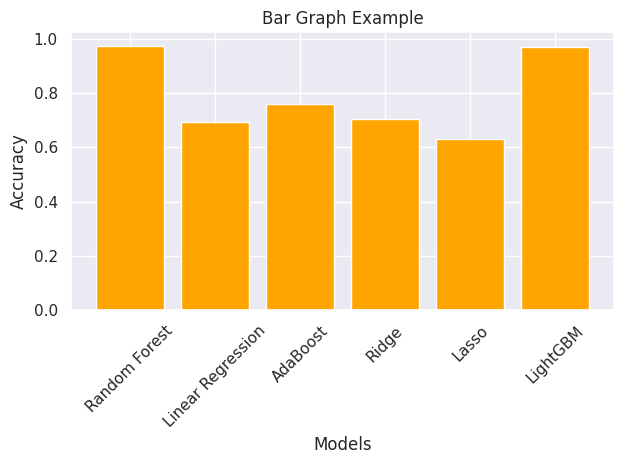

In [ ]:
import matplotlib.pyplot as plt

# Sample data
categories = ['Random Forest', 'Linear Regression', 'AdaBoost', 'Ridge', 'Lasso', 'LightGBM']
values = [forest.score(X_train, y_train),reg.score(X_train, y_train),ada_boost_reg.score(X_test, y_test),ridge_reg.score(X_test, y_test),lasso_reg.score(X_test, y_test),lgb_reg_opt.score(X_test, y_test)]

# Create a bar graph
plt.bar(categories, values, color=['orange', 'orange', 'orange', 'orange', 'orange', 'orange'])

# Add labels and title
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Bar Graph Example')

plt.xticks(rotation=45)

plt.tight_layout()
# Display the graph
plt.show()


In [ ]:
results_df

,Predicted Market Value (Random Forest),Predicted Market Value (Linear Regression),Predicted Using LGBM,Predicted Using Adaboost,Predicted Using Ridge,Predicted Using lasso,Actual Market Value
841,16.667786,16.162639,16.582560,16.008187,16.163001,16.168403,16.733281
125,15.193798,15.022926,15.182665,14.927787,15.022941,14.831642,15.201805
1605,15.067253,15.142020,15.063004,15.681479,15.142168,15.104783,15.096444
1636,14.006232,13.895791,13.975755,14.144567,13.895602,13.736219,14.077875
709,16.135062,16.199975,16.231946,16.268876,16.200282,16.302077,16.012735
...,...,...,...,...,...,...,...
2561,15.320521,15.368794,15.230284,15.829728,15.369075,15.699539,15.226498
1684,16.781321,15.603427,16.826058,16.268876,15.603693,15.838606,16.972511
868,16.092168,15.743486,16.073121,16.294430,15.743721,15.963532,16.257858
1166,14.427124,13.817534,14.335265,14.093885,13.817303,13.789612,14.508658


As we can see that Random Forest and Light GBM are two of the best fitted models so now we will compare the mean squared error for both of them

In [ ]:
from sklearn import metrics

In [ ]:
mean_sq_err_forest = metrics.mean_squared_error(y_test, predictions_forest)

In [ ]:
RMSE_forest = np.sqrt(mean_sq_err_forest)

In [ ]:
RMSE_forest

0.21525305866398667

In [ ]:
mean_sq_err_gbm = metrics.mean_squared_error(y_test, predictions_lgbm)

In [ ]:
RMSE_gbm = np.sqrt(mean_sq_err_gbm)

In [ ]:
RMSE_gbm

0.2332268628706042

# Test prediction part

In [ ]:
X_train = df1.drop(['name', 'Log Market Value'], axis=1)
y_train = df1['Log Market Value']
forest.fit(X_train, y_train)


RandomForestRegressor()

In [ ]:
forest.score(X_train, y_train)

0.9758661929017136

In [ ]:
lgb_reg_opt.score(X_train,y_train)

0.9705940269679425

In [ ]:
forest.predict(X_train)

array([16.44143308, 15.56619405, 16.82022819, ..., 15.97780497,
       14.40912049, 13.61538386])

In [ ]:
lgb_reg_opt.predict(X_train)

array([16.41167382, 15.64947265, 16.92888802, ..., 16.01836028,
       14.36527047, 13.56086911])

In [ ]:
predictions_forest_train = forest.predict(X_train)
predictions_LGBM_train = lgb_reg_opt.predict(X_train)

results_df_train = pd.DataFrame({'Predicted Market Value (Random Forest)': predictions_forest_train,
                                 'Predicted Market Value(Light GBM)': predictions_LGBM_train,
                           'Actual Market Value': y_train})

In [ ]:
results_df_train

,Predicted Market Value (Random Forest),Predicted Market Value(Light GBM),Actual Market Value
0,16.441433,16.411674,17.014184
1,15.566194,15.649473,15.520259
2,16.820228,16.928888,17.073607
3,15.012231,15.033601,15.068274
5,17.563650,17.846566,17.776324
...,...,...,...
2697,16.203364,16.112648,16.257858
2698,14.619642,14.730617,14.508658
2699,15.977805,16.018360,15.761421
2700,14.409120,14.365270,14.220976


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

# Create a Random Forest regressor
rf = RandomForestRegressor()

# Perform cross-validation
rf_score = cross_val_score(rf, X, y, cv=10, scoring='r2').mean()


In [ ]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import cross_val_score

# Create a LightGBM regressor
lgbm = LGBMRegressor()

# Perform cross-validation
lgbm_score = cross_val_score(lgbm, X, y, cv=10, scoring='r2').mean()


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 868
[LightGBM] [Info] Number of data points in the train set: 2390, number of used features: 10
[LightGBM] [Info] Start training from score 15.144084
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 878
[LightGBM] [Info] Number of data points in the train set: 2390, number of used features: 10
[LightGBM] [Info] Start training from score 15.187490
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [In

In [ ]:
rf_score

0.6951746413995314

In [ ]:
lgbm_score

0.7474995317052755

In [ ]:
rf.fit(X,y)

RandomForestRegressor()

In [ ]:
lgbm.fit(X,y)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 888
[LightGBM] [Info] Number of data points in the train set: 2656, number of used features: 10
[LightGBM] [Info] Start training from score 15.315700


LGBMRegressor()

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# X_train: Training features
# y_train: Training labels
# X_val: Validation features
# y_val: Validation labels


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Create a Random Forest regressor
rf = RandomForestRegressor()

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='r2', cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Access the best model
best_model = grid_search.best_estimator_

# Evaluate the best model
best_model_score = best_model.score(X_val, y_val)
print("Best Model Score:", best_model_score)

# Make predictions using the best model
predictions = best_model.predict(X_test)


Best Model Score: 0.8229577828904644


In [ ]:
from sklearn.metrics import mean_squared_error

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)


Mean Squared Error: 0.3352417362242138


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Evaluate the predictions using R^2 score
r21 = r2_score(y_test, y_pred)
print("R^2 Score:", r21)


Mean Squared Error: 0.3352417362242138
R^2 Score: 0.8229577828904644


In [ ]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV

# Create a LightGBM regressor
lgbm = LGBMRegressor()
# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [-1, 5, 10],  # -1 means no limit
    'learning_rate': [0.01, 0.1, 0.2],
    'num_leaves': [32, 63, 127]
}

# Create the GridSearchCV object
grid_search1 = GridSearchCV(estimator=lgbm, param_grid=param_grid, scoring='r2', cv=5)

# Fit the grid search to the training data
grid_search1.fit(X_train, y_train)

# Access the best model
best_model1 = grid_search1.best_estimator_

# Evaluate the best model
best_model_score1 = best_model1.score(X_val, y_val)
print("Best Model Score:", best_model_score1)

# Make predictions using the best model
predictions1 = best_model1.predict(X_test)


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Make predictions on the test set
y_pred = best_model1.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Evaluate the predictions using R^2 score
r2 = r2_score(y_test, y_pred)
print("R^2 Score:", r2)

Mean Squared Error: 0.2833352136621893
R^2 Score: 0.8503697809916817


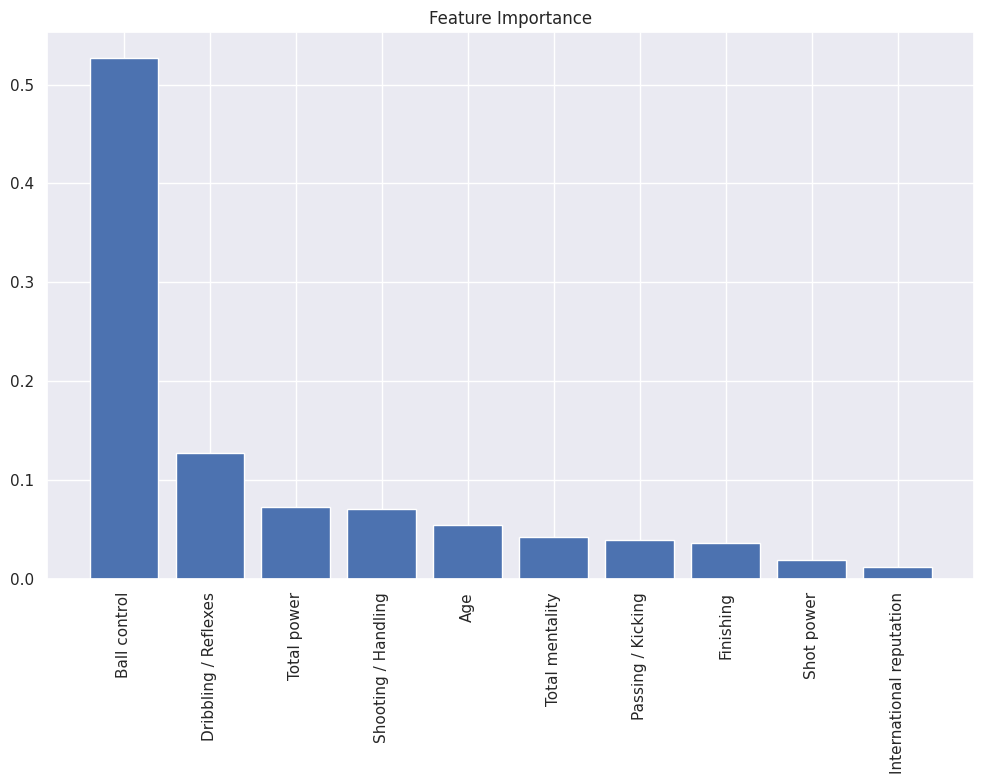

In [ ]:
import matplotlib.pyplot as plt

# Get feature importances
importances = best_model.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Plot feature importances
plt.figure(figsize=(10, 8))
plt.title("Feature Importance")
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.tight_layout()
plt.show()
#plt.savefig('feature_importances.png', transparent=True, bbox_inches='tight')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 1.9 MB/s eta 0:00:00


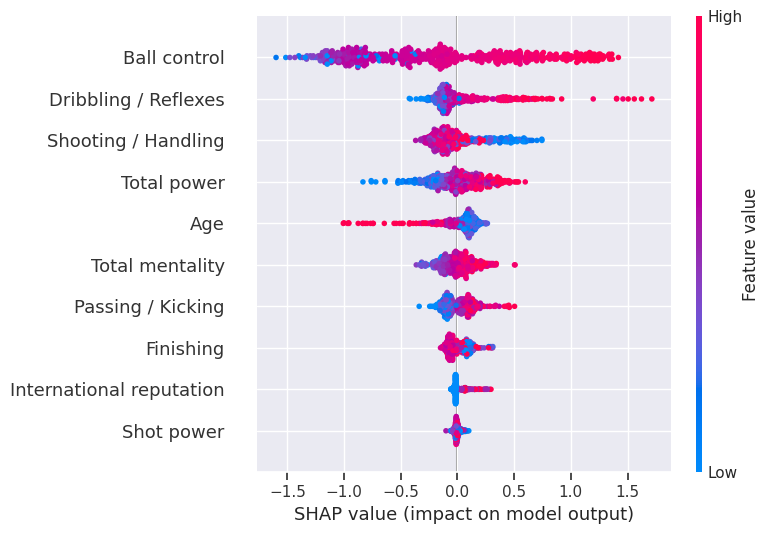

In [ ]:
!pip install shap
import shap

# Initialize a SHAP explainer
explainer = shap.Explainer(best_model)

# Calculate SHAP values for a set of instances
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values with a summary plot
shap.summary_plot(shap_values, X_test)


In [ ]:
import pandas as pd

# Create a DataFrame with real and predicted market values
results = pd.DataFrame({'Real Market Values': y_test, 'Predicted Market Values': y_pred})
print(results)


      Real Market Values  Predicted Market Values
841            16.733281                16.180631
125            15.201805                15.137006
1605           15.096444                15.043528
1636           14.077875                13.879062
709            16.012735                16.503884
...                  ...                      ...
2561           15.226498                15.163652
1684           16.972511                16.586021
868            16.257858                15.826122
1166           14.508658                14.297827
2151           14.880221                15.569361

[532 rows x 2 columns]


In [ ]:
print(results.head(10))  # Print the first 10 rows


      Real Market Values  Predicted Market Values
841            16.733281                16.180631
125            15.201805                15.137006
1605           15.096444                15.043528
1636           14.077875                13.879062
709            16.012735                16.503884
657            17.281246                16.853011
2668           13.997832                14.909534
775            13.815511                13.250004
174            16.556351                15.635112
465            17.233237                17.454494


"""
name                        0
Age                         0
Dribbling / Reflexes        0
Passing / Kicking           0
Shooting / Handling         0
International reputation    0
Total mentality             0
Shot power                  0
Total power                 0
Ball control                0
Finishing                   0
Log Market Value            0
"""

In [ ]:
index_value = 1000
feature_values = df1.loc[index_value]

for column_name, value in feature_values.iteritems():
    print(f"{column_name}: {value}")


name: E. Bardhi   
Age: 26
Dribbling / Reflexes: 79
Passing / Kicking: 77
Shooting / Handling: 78
International reputation: 2
Total mentality: 354
Shot power: 84
Total power: 317
Ball control: 77
Finishing: 74
Log Market Value: 15.341566861459324


<ipython-input-93-1d3f229b5efe>:4: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column_name, value in feature_values.iteritems():


In [ ]:
input_features = [
    {'Ball control': 77,
     'Dribbling / Reflexes': 79,
     'Total power': 317,
    'Shooting / Handling': 78,
     'Age': 26,
     'Total mentality': 354,
    'Finishing': 74,
     'Passing / Kicking': 77,
     'Shot power': 84,
     'International reputation': 2}
]


In [ ]:
input_data = pd.DataFrame(input_features)


input_array = input_data.values

predictions = best_model1.predict(input_array)
print(f"predicted market value is {predictions}")



predicted market value is [15.23108318]
